# Miniproject: Landing on the Moon

## Introduction

### Description

Traditionally, reinforcement learning has operated on "tabular" state spaces, e.g. "State 1", "State 2", "State 3" etc. However, many important and interesting reinforcement learning problems (like moving robot arms or playing Atari games) are based on either continuous or very high-dimensional state spaces (like robot joint angles or pixels). Deep neural networks constitute one method for learning a value function or policy from continuous and high-dimensional observations. 

In this miniproject, you will teach an agent to play the Lunar Lander game from [OpenAI Gym](https://gym.openai.com/envs/LunarLander-v2/). The agent needs to learn how to land a lunar module safely on the surface of the moon. The state space is 8-dimensional and (mostly) continuous, consisting of the X and Y coordinates, the X and Y velocity, the angle, and the angular velocity of the lander, and two booleans indicating whether the left and right leg of the lander have landed on the moon.

The agent gets a reward of +100 for landing safely and -100 for crashing. In addition, it receives "shaping" rewards at every step. It receives positive rewards for moving closer to [0,0], decreasing in velocity, shifting to an upright angle and touching the lander legs on the moon. It receives negative rewards for moving away from the landing site, increasing in velocity, turning sideways, taking the lander legs off the moon and for using fuel (firing the thrusters). The best score an agent can achieve in an episode is about +250.

There are two versions of the task: one with discrete controls and one with continuous controls but we'll only work with the discrete version. In the discrete version, the agent can take one of four actions at each time step: [do nothing, fire engines left, fire engines right, fire engines down]. 

We will use Policy Gradient approaches (using the REINFORCE rule) to learn the task. As you remember, in standard supervised learning tasks (e.g. image classification), the network generates a probability distribution over the outputs, and is trained to maximize the probability of a specific target output given an observation (input). In Policy Gradient methods, the network generates a probability distribution over actions, and is trained to maximize expected future rewards given an observation.

### Questions
**Question 1**. Suppose that you are designing the environment rewards yourself. Why do you think it is a good idea to have rewards in addition to the +100 reward for safe landing (e.g. for moving closer / further from [0, 0], for touching the lander legs on the moon)? One might say that if we only have a final reward, the agent will still be able to learn how to reach it. What will be the problem here?

**Answer**: Without these additional reward signals, the agent will have a difficult time learning from its actions. It will have to find descent strategies leading to the +100 reward by itself. In the best case, this will make the training much longer. In the worst case, the agent will fail to learn. Consequently, the additional rewards act as heuristic hint for the agent. \


**Question 2**. Now suppose you decide to give the agent a small reward if it moves closer to the landing point but you forget to penalize it when it moves away from it. What kinds of strange behaviour you may observe from the trained agent?

**Answer**: The agent would then exploit the small reward obtained by moving closer in a undesired way such for example repeteadly moving away and then returning closer to the starting point, since moving away is not penalized that block of actions would have a positive reward and the agent could repeat it indefinitely.


### Prerequisites

- You will need to install [Miniconda](https://docs.conda.io/en/latest/miniconda.html) and run the following commands:

  - conda create -n cs456env python=3.7.2
  - source activate cs456env
  - pip install gym[Box2D]
  - pip install ipykernel
  - pip install tensorflow
  - pip install keras
  - pip install matplotlib
  
- You should know the concepts of "policy", "policy gradient", "REINFORCE", "REINFORCE with baseline". If you want to start and haven't seen these yet in class, read Sutton & Barto (2018) Chapter 13 (13.1-13.4).

### What you will learn

- You will learn how to implement a policy gradient neural network using the REINFORCE algorithm.
- You will learn how to implement baselines, including a learned value network.
- You will learn how to analyze the performance of an RL algorithm.

### Notes 
- Reinforcement learning is noisy! Normally one should average over multiple random seeds with the same parameters to really see the impact of a change to the model, but we won't do this due to time constraints. However, you should be able to see learning over time with every approach. If you don't see any improvement, or very unstable learning, double-check your model and try adjusting the learning rate.

- You may sometimes see `AssertionError: IsLocked() = False` after restarting your code. To fix this, reinitialize the environments by running the Gym Setup code below.

- You will not be marked on the episode movies. Please delete these movies before uploading your code.

### Evaluation criteria

The miniproject is marked out of 18, with a further mark breakdown in each question:
- Exercise 1: 7 points
- Exercise 2: 3 points
- Exercise 3: 3 points
- Exercise 4: 5 points

We may perform random tests of your code but will not rerun the whole notebook.

In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

### Your Names

Before you start, please enter your sciper number(s) in the field below; they are used to load the data.

In [2]:
sciper = {'student_1': 320782, 
          'student_2': 263884}
seed = sciper['student_1']+sciper['student_2']

## Setup

### Dependencies and constants

In [3]:
import gym
import numpy as np
import matplotlib.pyplot as plt
import logging
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, clear_output
from gym.envs.box2d.lunar_lander import heuristic

# import keras
import tensorflow as tf
from tensorflow import keras # tf.keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Lambda
from tensorflow.keras.optimizers import Adam
from keras import backend as K

#Added
from datetime import datetime as dt
import os

np.random.seed(seed)
tf.random.set_seed(seed*2)

### Gym Setup

Here we load the Reinforcement Learning environments from Gym.

We limit each episode to 500 steps so that we can train faster. 

In [4]:
gym.logger.setLevel(logging.ERROR)
discrete_env = gym.make('LunarLander-v2')
discrete_env._max_episode_steps = 500
discrete_env.seed(seed*3)
gym.logger.setLevel(logging.WARN)

%matplotlib inline
plt.rcParams['figure.figsize'] = 12, 8
plt.rcParams["animation.html"] = "jshtml"

### Utilities

We include a function that lets you visualize an "episode" (i.e. a series of observations resulting from the actions that the agent took in the environment).

As well, we will use the `Results` class (a wrapper around a python dictionary) to store, save, load and plot your results. You can save your results to disk with `results.save('filename')` and reload them with `Results(filename='filename')`. Use `results.pop(experiment_name)` to delete an old experiment.

In [5]:
def AddValue(output_size, value):
    return Lambda(lambda x: x + value, output_shape=(output_size,))

def render(episode, env):
    
    fig = plt.figure()
    img = plt.imshow(env.render(mode='rgb_array'))
    plt.axis('off')

    def animate(i):
        img.set_data(episode[i])
        return img,

    anim = FuncAnimation(fig, animate, frames=len(episode), interval=24, blit=True)
    html = HTML(anim.to_jshtml())
    
    plt.close(fig)
    !rm None0000000.png
    
    return html

class Results(dict):
    
    def __init__(self, *args, **kwargs):
        if 'filename' in kwargs:
            data = np.load(kwargs['filename'])
            super().__init__(data)
        else:
            super().__init__(*args, **kwargs)
        self.new_key = None
        self.plot_keys = None
        self.ylim = None
        
    def __setitem__(self, key, value):
        super().__setitem__(key, value)
        self.new_key = key

    def plot(self, window, title=None):
        clear_output(wait=True)
        for key in self:
            #Ensure latest results are plotted on top
            if self.plot_keys is not None and key not in self.plot_keys:
                continue
            elif key == self.new_key:
                continue
            self.plot_smooth(key, window)
        if self.new_key is not None:
            self.plot_smooth(self.new_key, window)
        plt.xlabel('Episode')
        plt.ylabel('Reward')
        plt.legend(loc='lower right')
        if self.ylim is not None:
            plt.ylim(self.ylim)
        if title:
            plt.title(title)
        plt.show()
        
    def plot_smooth(self, key, window):
        if len(self[key]) == 0:
            plt.plot([], [], label=key)
            return None
        y = np.convolve(self[key], np.ones((window,))/window, mode='valid')
        x = np.linspace(window/2, len(self[key]) - window/2, len(y))
        plt.plot(x, y, label=key)
        
    def save(self, filename='results'):
        np.savez(filename, **self)

### Test runs

To get an idea of how the environment works, we'll plot an episode resulting from random actions at each point in time, and a "perfect" episode using a specially-designed function to land safely within the yellow flags. 

Please remove these plots before submitting the miniproject to reduce the file size.

In [6]:
def run_fixed_episode(env, policy):
    frames = []
    observation = env.reset()
    done = False
    while not done:
        frames.append(env.render(mode='rgb_array'))
        action = policy(env, observation)
        observation, reward, done, info = env.step(action)
    return frames
    
def random_policy(env, observation):
    return env.action_space.sample()

def heuristic_policy(env, observation):
    return heuristic(env.unwrapped, observation)

In [7]:
episode = run_fixed_episode(discrete_env, random_policy)
render(episode, discrete_env)

rm: cannot remove 'None0000000.png': No such file or directory


In [8]:
episode = run_fixed_episode(discrete_env, heuristic_policy)
render(episode, discrete_env)

rm: cannot remove 'None0000000.png': No such file or directory


## Experiment Loop

This is the method we will call to setup an experiment. Reinforcement learning usually operates on an Observe-Decide-Act cycle, as you can see below.

You don't need to add anything here; you will be working directly on the RL agent.

In [9]:
num_episodes = 3000

def run_experiment(experiment_name, env, num_episodes, policy_learning_rate=0.001, value_learning_rate=0.001, 
                   baseline=None, entropy_cost=0, max_ent_cost=0, num_layers=3):

    #Initiate the learning agent
    agent = RLAgent(n_obs=env.observation_space.shape[0], 
                    action_space=env.action_space,
                    policy_learning_rate=policy_learning_rate, 
                    value_learning_rate=value_learning_rate, 
                    discount=0.99, 
                    baseline=baseline, 
                    entropy_cost=entropy_cost, 
                    max_ent_cost=max_ent_cost,
                    num_layers=num_layers)

    rewards = []
    all_episode_frames = []
    step = 0
    for episode in range(1, num_episodes+1):
    
        #Update results plot and occasionally store an episode movie
        episode_frames = None
        if episode % 10 == 0:
            results[experiment_name] = np.array(rewards)
            results.plot(10)
        if episode % 500 == 0:
            episode_frames = []
            
        #Reset the environment to a new episode
        observation = env.reset()
        episode_reward = 0

        while True:
        
            if episode_frames is not None:
                episode_frames.append(env.render(mode='rgb_array'))

            # 1. Decide on an action based on the observations
            action = agent.decide(observation)

            # 2. Take action in the environment
            next_observation, reward, done, info = env.step(action)
            episode_reward += reward

            # 3. Store the information returned from the environment for training
            agent.observe(observation, action, reward)

            # 4. When we reach a terminal state ("done"), use the observed episode to train the network
            if done:
                rewards.append(episode_reward)
                if episode_frames is not None:
                    all_episode_frames.append(episode_frames)
                agent.train()
                break

            # Reset for next step
            observation = next_observation
            step += 1
            
    return all_episode_frames, agent

## The Agent

Here we give the outline of a python class that will represent the reinforcement learning agent (along with its decision-making network). We'll modify this class to add additional methods and functionality throughout the course of the miniproject.


In [10]:
class RLAgent(object):
    
    def __init__(self, n_obs, action_space, policy_learning_rate, value_learning_rate, 
                 discount, baseline=None, entropy_cost=0, max_ent_cost=0, num_layers=3, file_value=None):

        #We need the state and action dimensions to build the network
        self.n_obs = n_obs
        self.n_act = action_space.n        
        self.plr = policy_learning_rate
        self.vlr = value_learning_rate
        self.gamma = discount
        self.entropy_cost = entropy_cost
        self.max_ent_cost = max_ent_cost
        self.num_layers = num_layers
        self.baseline = baseline
        # moving avg in case of simple baseline
        if self.baseline == 'simple':
            self.b = 0.
            self.episode_counter = 1
        
        # load previous model
        self.file_value = file_value

        #These lists stores the cumulative observations for this episode
        self.episode_observations, self.episode_actions, self.episode_rewards = [], [], []

        #Build the keras network
        self._build_network()

    def reset(self):
        """Reset cumulative lists at the end of an episode"""
        self.episode_observations, self.episode_actions, self.episode_rewards = [], [], []

    def observe(self, state, action, reward):
        """ This function takes the observations the agent received from the environment and stores them
            in the lists above."""
        self.episode_observations.append(state)
        self.episode_actions.append(action)
        self.episode_rewards.append(reward)
        
    def decide(self, state):
        """ This function feeds the observed state to the network, which returns a distribution
            over possible actions. Sample an action from the distribution and return it."""
        # Get policy logits using the policy network
        policy = self.policy.predict_on_batch(np.array([state], dtype=np.float32))
        # Sample according to the obtained probabilities
        action = np.random.choice(self.n_act, 1, p=policy.squeeze(0))[0]
        return action
            
    def train(self):
        """ When this function is called, the accumulated episode observations, actions and discounted rewards
            should be fed into the network and used for training. Use the _get_returns function to first turn 
            the episode rewards into discounted returns. 
            Apply simple or adaptive baselines if needed, depending on parameters."""
        # Gather policy network batch and transform them into categorical
        binactions = keras.utils.to_categorical(self.episode_actions,
                                                num_classes=self.n_act)
        # Gather batch of returns 
        returns = np.expand_dims(self._get_returns(), axis=1)
        # Gather batch of states
        states = np.asarray(self.episode_observations, dtype=np.float32)
        # Deal with baseline
        if self.baseline == 'simple':
            # baseline is mean of returns
            episode_avg = returns.mean()
            # Compute actual moving average
            self.b = self.episode_counter/(self.episode_counter+1)*self.b + episode_avg/(self.episode_counter+1)
            self.episode_counter += 1
            # subtract baseline from returns
            returns = returns - self.b
        elif self.baseline == 'adaptive':
            # train value model
            self.value.train_on_batch(states, returns)
            # Compute baseline
            baseline = self.value.predict(states)            
            # subtract baseline from returns
            returns -= baseline
        # trina policy model
        self.policy.train_on_batch(x=states, y=binactions, sample_weight=returns)
        # reset internals
        self.reset()
        
    def _get_returns(self):
        """ This function should process self.episode_rewards and return the discounted episode returns
            at each step in the episode. Hint: work backwards."""
        returns = []
        for i in range(len(self.episode_rewards)):
            # Select rewards from step i to end
            r = np.array(self.episode_rewards[i:])
            # create a vector of gamma*(k-i-1)
            d = np.array([self.gamma**(k-i-1) for k in range(i+1, len(self.episode_rewards)+1)])
            # Compute return
            returns.append(r.dot(d))
        return np.array(returns, dtype=np.float32)

    def _build_network(self):
        """ This function should build the network that can then be called by decide and train. 
            The network takes observations as inputs and has a policy distribution as output."""
        # Build actor network (policy)
        self.policy = Sequential(name='actor')
        for i in range(self.num_layers):
            if i==0:
                self.policy.add(Dense(16, input_shape=(8,), activation='relu'))
            else:
                self.policy.add(Dense(16, activation='relu'))
        self.policy.add(Dense(self.n_act, activation='softmax', name='policy'))
        # Compile actor network (policy)
        self.policy.compile(loss='categorical_crossentropy', optimizer=Adam(self.plr))
        if self.baseline == 'adaptive':
            # Build critic network (value)
            self.value = Sequential(name='critc')
            for i in range(self.num_layers):
                if i==0:
                    self.value.add(Dense(16, input_shape=(8,), activation='relu'))
                else:
                    self.value.add(Dense(16, activation='relu'))
            self.value.add(Dense(1, activation=None, name='value'))
            # Compile critic network (value)
            self.value.compile(loss='mse', optimizer=Adam(self.vlr))

## Exercise 1: REINFORCE with simple baseline

### Description

Implement the REINFORCE Policy Gradient algorithm using a deep neural network as a function approximator.

1. Implement the `observe` method of the RLAgent above.
2. Implement the `_build_network` method. Your network should take the 8-dimensional state space as input and output a softmax distribution over the 4 discrete actions. It should have 3 hidden layers with 16 units each with ReLU activations. Use the REINFORCE loss function. HINT: Keras has a built-in "categorical cross-entropy" loss, and a `sample_weight` argument in fit/train_on_batch. Consider how these could be used together.
3. Implement the `decide`, `train` and `_get_returns` methods using the inputs and outputs of your network. In `train`, implement a baseline based on a moving average (over episodes) of the mean returns (over trials of one episode); it should only be in effect when the agent is constructed with the `use_simple_baseline` keyword. Also, use `train_on_batch` to form one minibatch from all the experiences in an episode. Hint: see Question 2) below.
4. Try a few learning rates and pick the best one (the default for Adam is a good place to start). Run the functions below and include the resulting plots, with and without the baseline, for your chosen learning rate. 
5. Answer the questions below in max. 1-2 sentence(s).

WARNING: Running any experiments with the same names (first argument in run_experiment) will cause your results to be overwritten. 

**Mark breakdown: 7 points total**
- 5 points for implementing and plotting basic REINFORCE with reasonable performance (i.e. a positive score) and answering the questions below.
- 2 points for implementing and plotting the simple baseline with reasonable performance.

### Solution

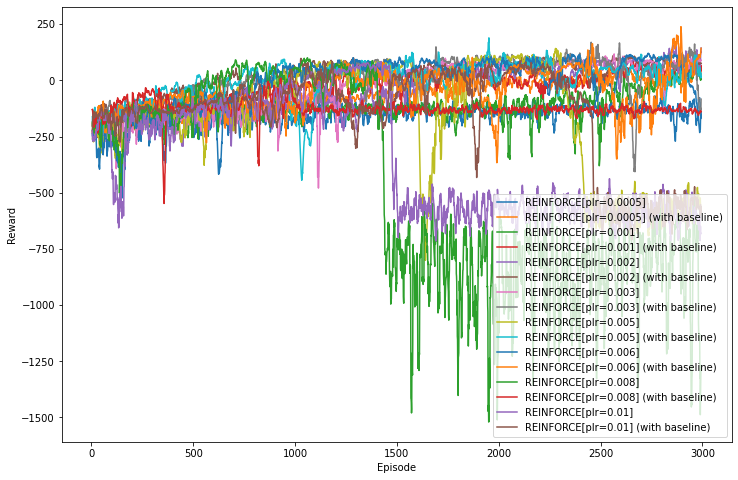

In [11]:
# Supply a filename here to load results from disk
results = Results()
lrs = [0.0005, 0.001, 0.002, 0.003, 0.005, 0.006, 0.008, 0.01]
for plr in lrs:
    now = dt.now()
    _,_ = run_experiment(f"REINFORCE[plr={plr}]", discrete_env, 
                         num_episodes, plr)        
    episodes, _ = run_experiment(f"REINFORCE[plr={plr}] (with baseline)", 
                                 discrete_env, num_episodes, 
                                 plr,baseline='simple')

In [15]:
# Compile results
simple_results = Results()
none_results = Results()
for k,v in results.items():
    plr = k[k.find('plr')+4:k.find(']')]
    if '(with baseline)' in k:
        simple_results[plr] = v
    else:
        none_results[plr] = v

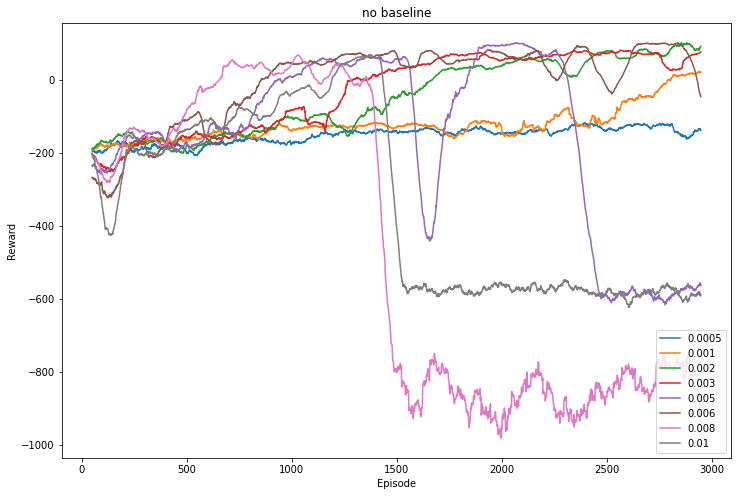

In [16]:
# Plot reward curves (no baseline)
none_results.plot(window=100, title='no baseline')

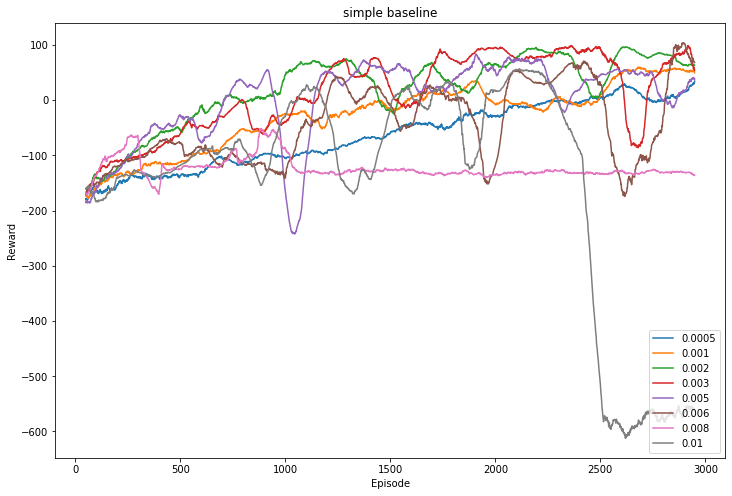

In [17]:
# plot reward curves (simple baseline)
simple_results.plot(window=100, title='simple baseline')

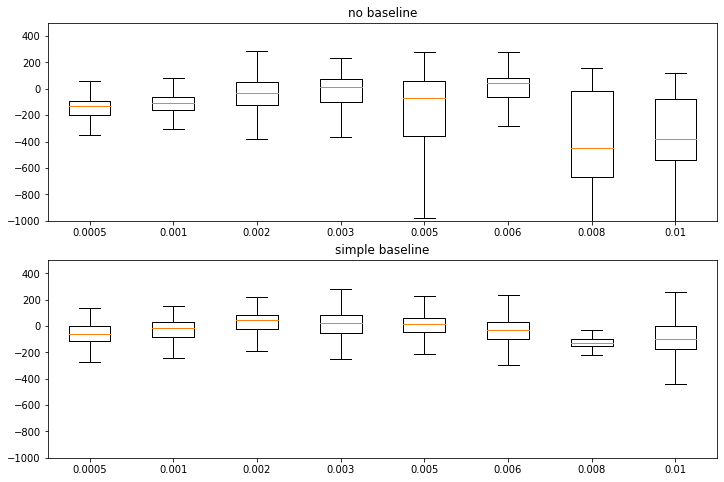

In [18]:
# Box plot of rewards across experiments
f, axs = plt.subplots(nrows=2, ncols=1)
axs[0].boxplot(none_results.values(), showfliers=False)
axs[0].set_xticklabels(none_results.keys())
axs[0].set_title('no baseline')
axs[0].set_ylim([-1000, 500])
axs[1].boxplot(simple_results.values(), showfliers=False)
axs[1].set_xticklabels(simple_results.keys())
axs[1].set_title('simple baseline')
axs[1].set_ylim([-1000, 500])
plt.show()

**Policy learning rate discussion**: Based on the above plots we can propose the following learning rates. Using `REINFORCE without baseline`, it seems that `plr=0.002` and `plr=0.003` give the best results. They both have a quite steadily increasing smoothed reward curve and not too much dispersion. The maximal reward is achieved by `plr=0.002` therefore we recommend this learning rate value. Note that `plr=0.006` reaches comparable maximal rewards. However, the reward curve is much more noisy and the neighboring `plr` values (i.e `0.005` and `0.008`) result in pretty bad performance. Considering this, we do not recommend this learning rate. Using `REINFORCE with simple baseline`, the situation is fairly similar. `plr=0.003` and `plr=0.002` display quite steadily increasing smoothed reward curves and high maximal rewards. Choosing any of these values should ensure good performance. Again, the `plr=0.006` reaches high maximal reward. However, the observations discrediting this values discussed above still apply.

**Question 1**: We have at least three posibilities of picking the action: i) sample an action according to the softmax distribution, ii) select action with max action probability and iii) use an epsilon-greedy strategy. What is the difference between these strategies and which one(s) is(are) preferable during training and which one(s) is(are) preferable during testing?. 


**Answer**: \
i. **softmax distribution**: Sampling actions according to a softmax distribution has the advantage of favoring exploration due thanks to randomness. Indeed, even though some actions may have much higher probabilities to be selected, other ones will also be selected eventually. \
ii. **Selecting the max action probability**: This action selection policy generates no additional exploration. The agent will simply follow what it is most sure about. \
iii. **Epsilon-greedy**: Selecting the action using an epsilon greedy strategy allows us to ensure that our agent will sufficiently explore a fraction epsilon of the time. However, it requires an additional hyper parameter and therefore more fine-tuning of the algorithm.

During training, exploration is critical. Therefore, selecting the max probability is a very bad strategy as the policy is not yet trained and therefore probably not good. To encourage exploration, one should favor epsilon-greedy or softmax policy. However, to test the performance of a trained agent, selecting the max action probability is a good strategy as no exploration is needed.

**Question 2**: In the train method above we throw away the data from an episode after we use it to train the network (make sure that you do that). Why is it not a good idea to keep the old episodes and train the policy network on both old and new data? (Note: Reusing data can still be possible but requires modifications to the REINFORCE algorithm that we are using).

**Answer**: Storing all episodes and retraining on them increases at every step the computational cost and it may also result in storage issues, also the fact that past episodes are retrained over and over may result in overfitting.

## Exercise 2: Adaptive baseline
### Description

Add a second neural network to your model that learns an observations-dependent adaptive baseline and subtracts it from your discounted returns.

1. Modify the `_build_network` function of RLAgent to create a second "value network" when `adaptive` is passed for the baseline argument. The value network should have the same or similar structure as the policy network, without the softmax at the output.
3. In addition to training your policy network, train the value network on the Mean-Squared Error compared to the discounted returns.
4. Train your policy network on $R - b(s)$, i.e. the returns minus the adaptive baseline (the output of the value network). Your implementation should allow for a different learning rate for the value and policy network.
5. Try a few learning rates and plot all your best results together (without baseline, with simple baseline, with adaptive baseline). You may or may not be able to improve on the simple baseline! Return the trained model to use it in the next exercise.

TECHNICAL NOTE: Some textbooks may refer to this approach as "Actor-Critic", where the policy network is the "Actor" and the value network is the "Critic". Sutton and Barto (2018) suggest that Actor-Critic only applies when the discounted returns are bootstrapped from the value network output, as you saw in class. This can introduce instability in learning that needs to be addressed with more advanced techniques, so we won't use it for this miniproject. You can read more about state-of-the-art Actor-Critic approaches here: https://arxiv.org/pdf/1602.01783.pdf

**Mark breakdown: 3 points total**
- 3 points for implementing and plotting the adaptive baseline with the other two conditions, with reasonable performance (i.e. at least similar to the performance in Exercise 1).

### Solution

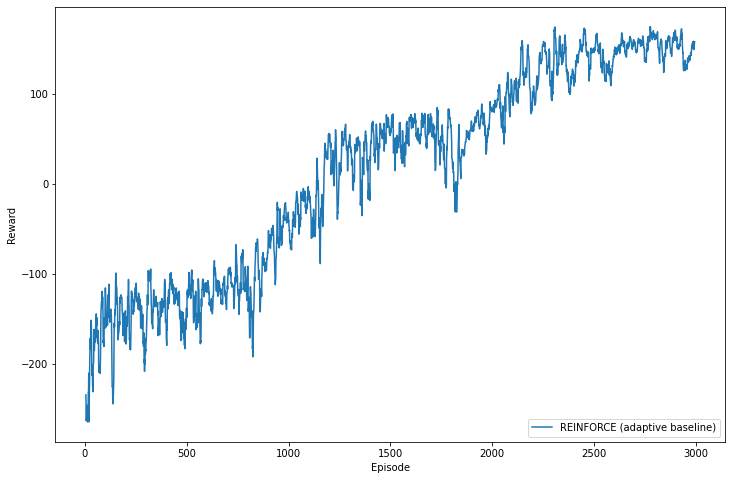

In [9]:
results = Results()
policy_learning_rate=0.002
value_learning_rate = 0.002
episodes, d_model = run_experiment("REINFORCE (adaptive baseline)", discrete_env, num_episodes, policy_learning_rate, 
                                   value_learning_rate, baseline='adaptive')

In [10]:
render(episodes[-1], discrete_env)

rm: cannot remove 'None0000000.png': No such file or directory


## Exercise 3: Visualizing the Value Function

### Description

Ideally, our value network should have learned to predict the relative values across the input space. We can test this by plotting the value prediction for different observations.

1. Write a function to plot the value network prediction across [x,y] space for given (constant) values of the other state variables. X is always in [-1,1], and Y generally lies in [-0.2,1], where the landing pad is at [0,0]. (`plt.imshow`, `plt.title`, and `plt.colorbar` can be useful)
2. Plot (with titles specifying the state variable combinations) the values for 5-6 combinations of the other 6 state variables, including [0,0,0,0,0,0]. The X and Y velocity are generally within [-1,1], the angle is in [-pi,pi] and the angular velocity lies roughly within [-3,3]. The last two inputs indicating whether the legs have touched the ground are 0 (False) or 1 (True). Include two combinations with (one of the) state variables out of these ranges. Use the same color bar limits across the graphs so that they can be compared easily. 
3. Answer the question below in max. 2-3 sentence(s).

**Mark breakdown: 3 points total**
- 3 points for the plots of the value function and answering the question below.

### Solution

In [9]:
def plot_value(agent, state, len_x=21, len_y=7):
    x_range = np.linspace(-1, 1, len_x)
    y_range = np.linspace(-0.2, 1, len_y)
    states = np.zeros((len_x, len_y, len(state)))
    
    # build states for all possible rocket positions
    state_aft = [state[i] for i in range(2, 8)]
    build_state = lambda x, y: np.array([x, y] + state_aft)
    
    for ix, x in enumerate(x_range):
        for iy, y in enumerate(y_range):
            states[ix,iy,:] = build_state(x, y)
    
    # compute values
    values = agent.value.predict_on_batch(states.reshape(-1, len(state)))
    values = values.reshape(len_x, len_y)
    
    # display values
    im = plt.imshow(values.T, origin='lower')
    plt.colorbar(im)
    plt.xticks(range(0,len_x),np.round(np.arange(-1,1.1,2.1/len_x), decimals = 2))
    plt.yticks(range(0,len_y),np.round(np.arange(-0.2,1.2,1.4/len_y), decimals = 2))
    plt.title('Value prediction for state: {}'.format(['x', 'y'] + state))
    plt.xlabel('x')
    plt.ylabel('y', rotation=360)

In [10]:
# Load agent with models using adaptive baseline (from Ex. 2)
agent = RLAgent(n_obs=discrete_env.observation_space.shape[0], 
                action_space=discrete_env.action_space,
                policy_learning_rate = 2e-3,
                value_learning_rate = 2e-3, 
                discount=0.99,
                baseline='adaptive',
                file_value='ex2_value_share.h5')

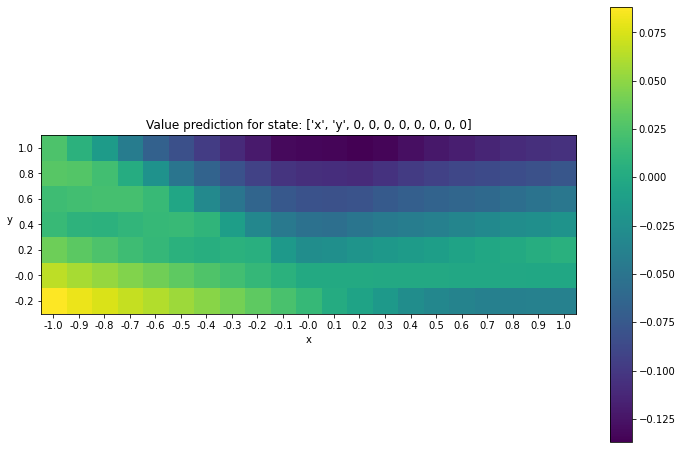

In [17]:
# all zeros
state = [0]*8
plot_value(agent, state)

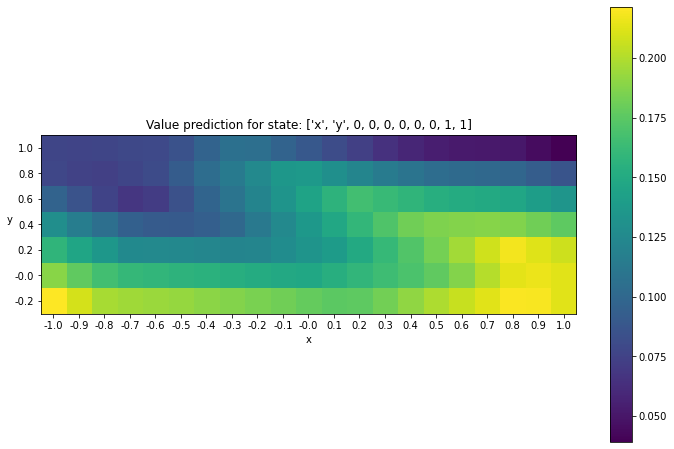

In [12]:
# touching the ground
state = [0,0,0,0,0,0,1,1]
plot_value(agent, state)

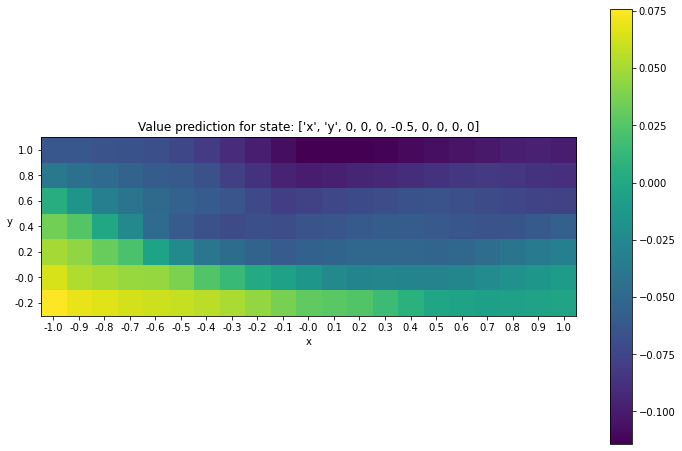

In [18]:
# going down
state = [0,0,0,-0.5,0,0,0,0]
plot_value(agent, state)

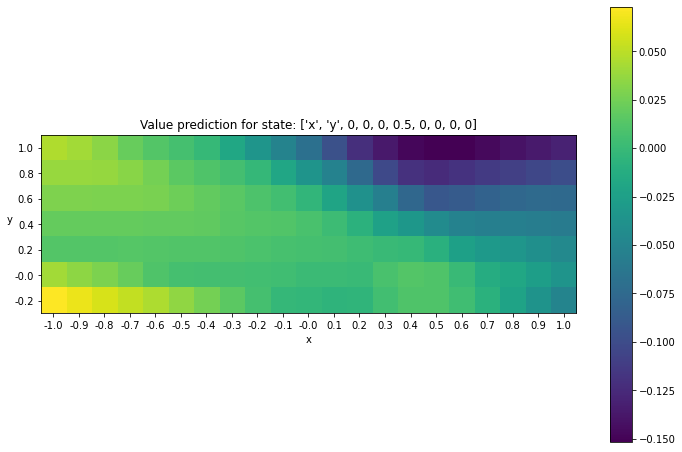

In [19]:
# going up
state = [0,0,0,0.5,0,0,0,0]
plot_value(agent, state)

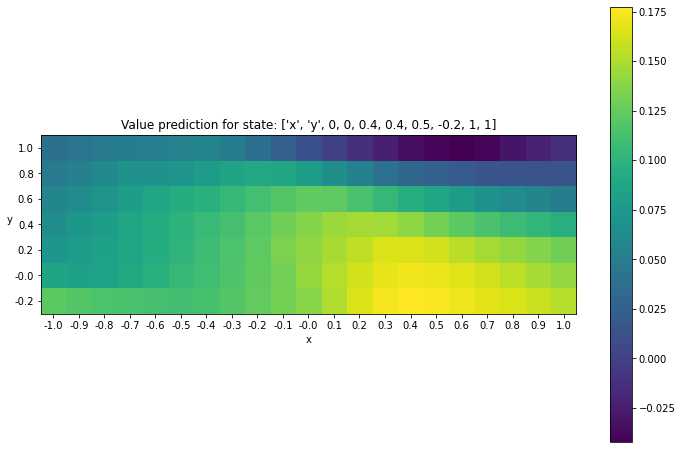

In [15]:
# mixed combination in range
state = [0,0,0.4,0.4,0.5,-0.2,1,1]
plot_value(agent, state)

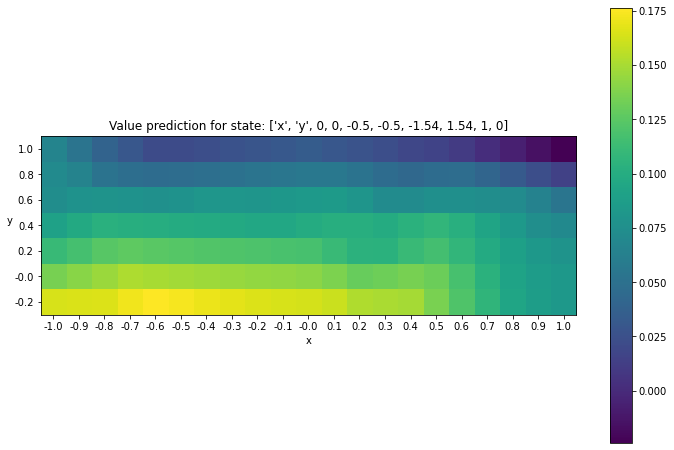

In [16]:
# mixed combination in range
state = [0,0,-0.5,-0.5,-1.54,1.54,1,0]
plot_value(agent, state)

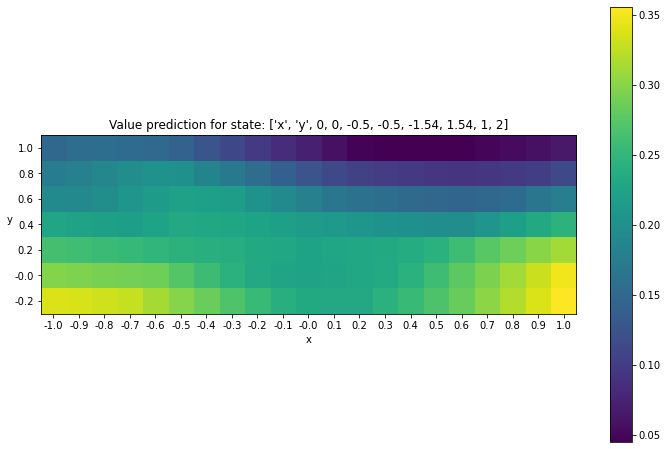

In [17]:
# mixed combination out of range
state = [0,0,-0.5,-0.5,-1.54,1.54,1,2]
plot_value(agent, state)

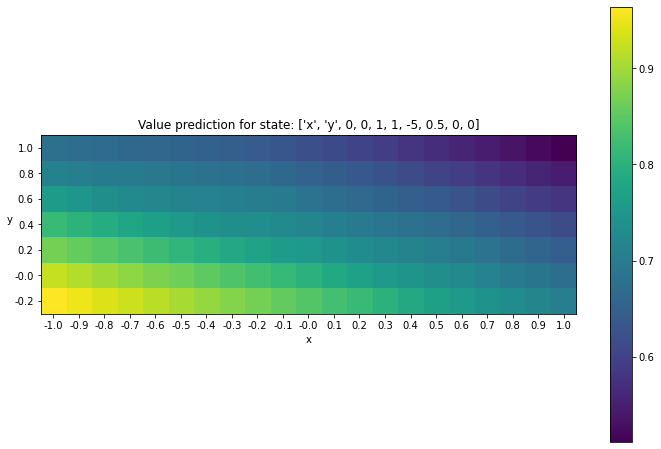

In [18]:
# mixed combination out of range
state = [0,0,1,1,-5,0.5,0,0]
plot_value(agent, state)

**Question**: Does your value map for the state variables combination [0,0,0,0,0,0] make sense? What about the value maps for the combinations with state variables out of the ranges above?

**Answer**: The combination for [0,0,0,0,0,0] makes sense regarding the y direction because lower y's ( closer to our objective of y=0 ) have on average an higher value than those with a greater magnitude. Although there is an asymmetry in the prediction of the x-coordinate because it assigns a higher value to points that are shifted to the left. In theory this combination should be symmetric with respect to the x direction, and the lack of it could be caused by the randomness in the training and the fact that sometimes our lander, after touching the ground, kept moving along the x direction. The same asymmetry is present in the third combination in which the lander has a certain velocity going down. We also obtained that the fourth combination ( lander going up ) has higher value on average than the third combination ( lander going down). We also notice that the highest value are achieved when the lander is touching the ground ( combination two ).


## Exercise 4: Comparing Architectures
### Descrition

Choosing a good neural network architecture is always a tricky question - on one hand, you want a complex architecture that is flexible enough to be able to solve the task, and on the other hand, you want to train your network as fast as possible and to not overuse your computational power. In the previous sections, we asked you to create a network with 3 hidden layers which you saw that is able to successfully solve the task and play the game. What happens if we do the same with 1 or 2 hidden layers? In this exercise, we ask you to look into the effect of the architecture and to compare different models with each other.

1. Include an extra parameter `num_layers` in the RLAgent class (by default it is equal to 3).
2. Change the `_build_network` function so that it creates a policy and value networks with the required number of layers.
3. Compare (on the same axes) the resulting plots for num_layers = 1, 2, 3.

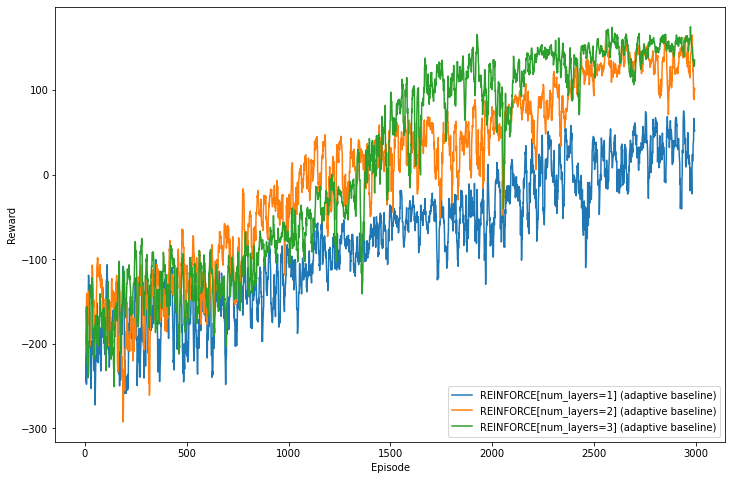

In [10]:
policy_learning_rate=0.002
value_learning_rate = 0.002
now = dt.now()
filename = now.strftime(f'ex4-M%mD%d-H%HM%M-distinctNets')
results = Results()
for num_layers in range(1,4):
    episodes, d_model = run_experiment(
        f"REINFORCE[num_layers={num_layers}] (adaptive baseline)", 
        discrete_env, num_episodes, policy_learning_rate, 
        value_learning_rate, baseline='adaptive',
        num_layers=num_layers
    )
results.save(filename=filename)

## For your Interest..

The code you've written above can be easily adapted for other environments in Gym. If you like, try playing around with different environments and network structures!